### Importing stuff

In [1]:
%matplotlib inline
import scipy.stats as stats
from IPython.core.pylabtools import figsize
import numpy as np
figsize(12.5, 4)

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

In [2]:
%pylab qt4

Populating the interactive namespace from numpy and matplotlib


### The Bayesian landscape

When we setup a Bayesian inference problem with $N$ unknowns, we are implicitly creating an $N$ dimensional space for the prior distributions to exist in. Associated with the space is an additional dimension, which we can describe as the *surface*, or *curve*, that sits on top of the space, that reflects the *prior probability* of a particular point. The surface on the space is defined by our prior distributions. For example, if we have two layers(unknowns) with  $p_1$ and $p_2$, and priors for both are $\text{Normal}$, for the first layer *alpha* the mean is in 0 and the standard deviation is samll. For the second layer *beta* the  mean is around 200 m depth and the standard deviation is bigger. The space created is a mountain which peak is set in 0,200 of a 2D space:


![](prob_model.png)
 
![](bayes_formula.png)

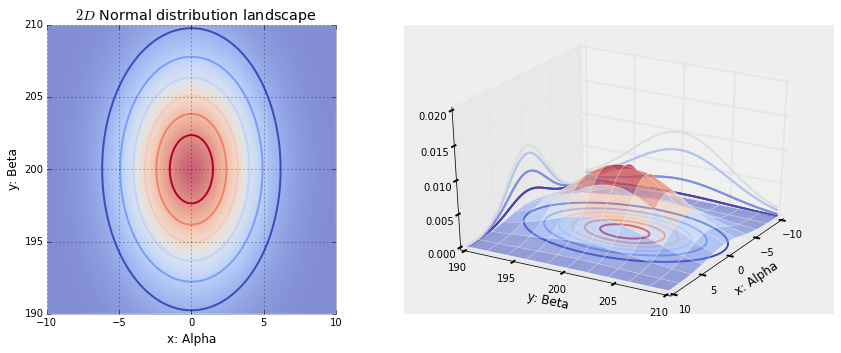

In [2]:
from matplotlib import cm

figsize(12.5, 5)
fig = plt.figure()
plt.subplot(121)

x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y+200)

# We set our normal distribution
nor_x = stats.norm.pdf(x, scale=5) # Related to estandar deviation: more unknown in beta
nor_y = stats.norm.pdf(y, scale=3.162278 ) 


# Contour plot:
M = np.dot(nor_x[:, None], nor_y[None, :])
CS = plt.contour(X, Y, M,  cmap=cm.coolwarm)#,extent=(-30, 30, -30, 30))
im = plt.imshow(M, interpolation='none', origin='lower', alpha=0.6,
     cmap=cm.coolwarm, extent=(-10, 10, 190, 210))

plt.xlabel("x: Alpha")
plt.ylabel("y: Beta")
#plt.xlim(-10,10)
#plt.ylim(-10,10)

plt.title("  $2D$ Normal distribution landscape")
plt.tight_layout()


# 3D plot
ax = fig.add_subplot(122, projection='3d')
ax.plot_surface(X, Y, M,  cmap=cm.coolwarm, alpha=0.5)
ax.view_init(azim=390)

#ax.set_xlim([-10, 10])
#ax.set_ylim([-10, 10])

ax.set_zlim([0, 0.02])
ax.set_xlabel("x: Alpha")
ax.set_ylabel("y: Beta")

cset = ax.contour(X, Y, M, zdir='z', offset=0, cmap=cm.coolwarm)
cset = ax.contour(X, Y, M, zdir='x', offset=-10, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='y', offset= 190, cmap=cm.coolwarm_r)



If these surfaces describe our *prior distributions* on the unknowns, what happens to our space after we incorporate our observed data $X$? The data $X$ does not change the space, but it changes the surface of the space by *pulling and stretching the fabric of the prior surface* to reflect where the true parameters likely live. More data means more pulling and stretching, and our original shape becomes mangled or insignificant compared to the newly formed shape. Less data, and our original shape is more present.  Regardless, the resulting surface describes the *posterior distribution*. 

For two dimensions, the data essentially *pushes up* the original surface to make *tall mountains*. The tendency of the observed data to *push up* the posterior probability in certain areas is checked by the prior probability distribution, so that lower prior probability means **more resistance**. Thus in the double-normal prior case above, a mountain (or multiple mountains) that might erupt near the (0,200) corner would be much higher than mountains that erupt closer to (10,220), since there is more **resistance (low prior probability)** near (10,220). The peak reflects the posterior probability of where the *true parameters are likely to be found*. Importantly, if the prior has assigned a probability of 0, then no posterior probability will be assigned there. 

Suppose the priors mentioned above represent different parameters $\lambda$ of two Poisson distributions. We observe a few data points and visualize the new landscape: 

observed (2-dimensional,sample size = 1): [[0 4]]
[ 0.00247875]
[0]


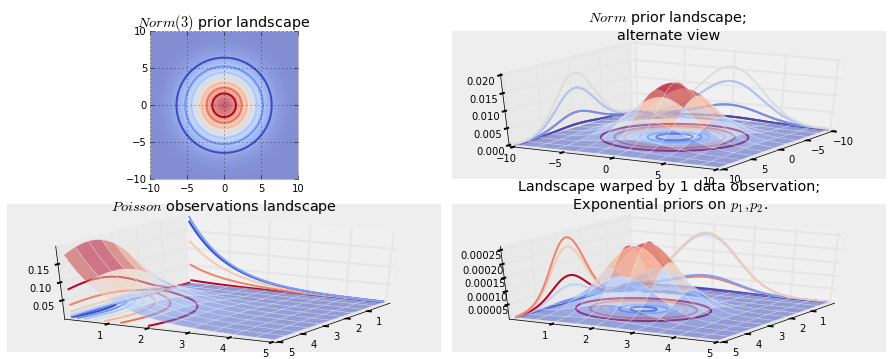

In [3]:
from matplotlib import cm

figsize(12.5, 5)
fig = plt.figure()
plt.subplot(221)

x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y)

exp_x = stats.norm.pdf(x, scale=3.162278)

#print exp_x[:, None]

exp_y = stats.norm.pdf(x, scale=3.162278)


M = np.dot(exp_x[:, None], exp_y[None, :])
CS = plt.contour(X, Y, M,  cmap=cm.coolwarm,extent=(-10, 10, -10, 10))
im = plt.imshow(M, interpolation='none', origin='lower', alpha=0.6,
                 cmap=cm.coolwarm, extent=(-10, 10, -10, 10))
plt.xlim(-10,10)
plt.ylim(-10,10)

    #plt.scatter(alpha.trace[51], beta.trace[51], c="k", s=50, edgecolor="none")
#plt.xlabel("prior on $p_1$")
#plt.ylabel("prior on $p_2$")
plt.title("$Norm(3)$ prior landscape")

#plt.subplot(222)
#plt.plot(exp_x)
plt.tight_layout()

ax = fig.add_subplot(222, projection='3d')
ax.plot_surface(X, Y, M,  cmap=cm.coolwarm, alpha=0.5)
ax.view_init(azim=390)
ax.set_xlim([-10, 10])
ax.set_ylim([-10, 10])
ax.set_zlim([0, 0.02])


plt.title("$Norm$ prior landscape; \nalternate view")


cset = ax.contour(X, Y, M, zdir='z', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='x', offset=-10, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='y', offset=-10, cmap=cm.coolwarm_r)



# create the observed data

# sample size of data we observe, trying varying this (keep it less than 100 ;)

N = 1


# the true parameters, but of course we do not see these values...
lambda_1_true = 2
lambda_2_true = 4

#...we see the data generated, dependent on the above two values.
data = np.concatenate([
    stats.poisson.rvs(lambda_1_true, size=(N, 1)),
    stats.poisson.rvs(lambda_2_true, size=(N, 1))
], axis=1)


print "observed (2-dimensional,sample size = %d):" % N, data
print stats.poisson.pmf(data[:, 0],6)
print data[:,0]

# plotting details.
x = y = np.linspace(.01, 5, 100)
X, Y = np.meshgrid(x, y)

likelihood_x = np.array([stats.poisson.pmf(data[:, 0], _x)
                        for _x in x]).prod(axis=1)
likelihood_y = np.array([stats.poisson.pmf(data[:, 1], _y)
                        for _y in y]).prod(axis=1)
L = np.dot(likelihood_x[:, None], likelihood_y[None, :])



#plt.subplot(121)
ax = fig.add_subplot(223, projection='3d')
ax.plot_surface(X, Y, L,  cmap=cm.coolwarm, alpha=0.5)
ax.view_init(azim=390)

cset = ax.contour(X, Y, L, zdir='z', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, L, zdir='x', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, L, zdir='y', offset=0, cmap=cm.coolwarm_r)
#print L*M
plt.title("$Poisson$ observations landscape")


#plt.subplot(121)
ax = fig.add_subplot(224, projection='3d')
ax.plot_surface(X, Y, M*L,  cmap=cm.coolwarm, alpha=0.5)
ax.view_init(azim=390)

cset = ax.contour(X, Y, M*L, zdir='z', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M*L, zdir='x', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M*L, zdir='y', offset=0, cmap=cm.coolwarm_r)

plt.title("Landscape warped by %d data observation;\n Exponential priors on $p_1, p_2$." % N)
#print L*M

### Exploring the landscape

We should explore the deformed posterior space generated by our prior surface and observed data to find the posterior mountain. However, we cannot naively search the space: any computer scientist will tell you that traversing $N$-dimensional space is exponentially difficult in $N$: the size of the space quickly blows-up as we increase $N$ (see [the curse of dimensionality](http://en.wikipedia.org/wiki/Curse_of_dimensionality)). What hope do we have to find these hidden mountains? The idea behind MCMC is to perform an intelligent search of the space. To say "search" implies we are looking for a particular point, which is perhaps not an accurate as we are really looking for a broad mountain. 

Recall that MCMC returns *samples* from the posterior distribution, not the distribution itself. Stretching our mountainous analogy to its limit, MCMC performs a task similar to repeatedly asking  "How likely is this pebble I found to be from the mountain I am searching for?", and completes its task by returning thousands of accepted pebbles in hopes of reconstructing the original mountain. In MCMC and PyMC lingo, the returned sequence of "pebbles" are the samples,  cumulatively called the *traces*. 

When I say MCMC intelligently searches, I really am saying MCMC will *hopefully* converge towards the areas of high posterior probability. MCMC does this by exploring nearby positions and moving into areas with higher probability. Again, perhaps "converge" is not an accurate term to describe MCMC's progression. Converging usually implies moving towards a point in space, but MCMC moves towards a *broader area* in the space and randomly walks in that area, picking up samples from that area.

####Why Thousands of Samples?

At first, returning thousands of samples to the user might sound like being an inefficient way to describe the posterior distributions. I would argue that this is extremely efficient. Consider the alternative possibilities:

1. Returning a mathematical formula for the "mountain ranges" would involve describing a N-dimensional surface with arbitrary peaks and valleys.
2. Returning the "peak" of the landscape, while mathematically possible and a sensible thing to do as the highest point corresponds to most probable estimate of the unknowns, ignores the shape of the landscape, which we have previously argued is very important in determining posterior confidence in unknowns. 

Besides computational reasons, likely the strongest reason for returning samples is that we can easily use *The Law of Large Numbers* to solve otherwise intractable problems. I postpone this discussion for the next chapter. With the thousands of samples, we can reconstruct the posterior surface by organizing them in a histogram. 


### Algorithms to perform MCMC

There is a large family of algorithms that perform MCMC. Most of these algorithms can be expressed at a high level as follows: (Mathematical details can be found in the appendix.)

1. Start at current position.
2. Propose moving to a new position (investigate a pebble near you).
3. Accept/Reject the new position based on the position's adherence to the data and prior distributions (ask if the pebble likely came from the mountain).
4.  1.  If you accept: Move to the new position. Return to Step 1.
    2. Else: Do not move to new position. Return to Step 1. 
5. After a large number of iterations, return all accepted positions.

This way we move in the general direction towards the regions where the posterior distributions exist, and collect samples sparingly on the journey. Once we reach the posterior distribution, we can easily collect samples as they likely all belong to the posterior distribution. 

If the current position of the MCMC algorithm is in an area of extremely low probability, which is often the case when the algorithm begins (typically at a random location in the space), the algorithm will move in positions *that are likely not from the posterior* but better than everything else nearby. Thus the first moves of the algorithm are not reflective of the posterior.

In the above algorithm's pseudocode, notice that only the current position matters (new positions are investigated only near the current position). We can describe this property as *memorylessness*, i.e. the algorithm does not care *how* it arrived at its current position, only that it is there. 

### Other approximation solutions to the posterior
Besides MCMC, there are other procedures available for determining the posterior distributions. A Laplace approximation is an approximation of the posterior using simple functions. A more advanced method is [Variational Bayes](http://en.wikipedia.org/wiki/Variational_Bayesian_methods). All three methods, Laplace Approximations, Variational Bayes, and classical MCMC have their pros and cons. We will only focus on MCMC in this book. That being said, my friend Imri Sofar likes to classify MCMC algorithms as either "they suck", or "they really suck". He classifies the particular flavour of MCMC used by PyMC as just *sucks* ;)

## The Metropolis-Hastings Algorithm

The key to success in applying the Gibbs sampler to the estimation of Bayesian posteriors is being able to specify the form of the complete conditionals of
${\bf \theta}$, because the algorithm cannot be implemented without them. In practice, the posterior conditionals cannot always be neatly specified. 


Taking a different approach, the Metropolis-Hastings algorithm generates ***candidate***  state transitions from an alternate distribution, and *accepts* or *rejects* each candidate probabilistically.

Let us first consider a simple Metropolis-Hastings algorithm for a single parameter, $\theta$. We will use a standard sampling distribution, referred to as the *proposal distribution*, to produce candidate variables $q_t(\theta^{\prime} | \theta)$. That is, the generated value, $\theta^{\prime}$, is a *possible* next value for
$\theta$ at step $t+1$. We also need to be able to calculate the probability of moving back to the original value from the candidate, or
$q_t(\theta | \theta^{\prime})$. These probabilistic ingredients are used to define an *acceptance ratio*:

$$\begin{gathered}
\begin{split}a(\theta^{\prime},\theta) = \frac{q_t(\theta^{\prime} | \theta) \pi(\theta^{\prime})}{q_t(\theta | \theta^{\prime}) \pi(\theta)}\end{split}\notag\\\begin{split}\end{split}\notag\end{gathered}$$

The value of $\theta^{(t+1)}$ is then determined by:

$$\theta^{(t+1)} = \left\{\begin{array}{l@{\quad \mbox{with prob.} \quad}l}\theta^{\prime} & \text{with probability } \min(a(\theta^{\prime},\theta^{(t)}),1) \\ \theta^{(t)} & \text{with probability } 1 - \min(a(\theta^{\prime},\theta^{(t)}),1) \end{array}\right.$$

This transition kernel implies that movement is not guaranteed at every step. It only occurs if the suggested transition is likely based on the acceptance ratio.

A single iteration of the Metropolis-Hastings algorithm proceeds as follows:

1.  Sample $\theta^{\prime}$ from $q(\theta^{\prime} | \theta^{(t)})$.

2.  Generate a Uniform[0,1] random variate $u$.

3.  If $a(\theta^{\prime},\theta) > u$ then
    $\theta^{(t+1)} = \theta^{\prime}$, otherwise
    $\theta^{(t+1)} = \theta^{(t)}$.

The original form of the algorithm specified by Metropolis required that
$q_t(\theta^{\prime} | \theta) = q_t(\theta | \theta^{\prime})$, which reduces $a(\theta^{\prime},\theta)$ to
$\pi(\theta^{\prime})/\pi(\theta)$, but this is not necessary. In either case, the state moves to high-density points in the distribution with high probability, and to low-density points with low probability. After convergence, the Metropolis-Hastings algorithm describes the full target posterior density, so all points are recurrent.

### Random-walk Metropolis-Hastings

A practical implementation of the Metropolis-Hastings algorithm makes use of a random-walk proposal.
Recall that a random walk is a Markov chain that evolves according to:

$$
\theta^{(t+1)} = \theta^{(t)} + \epsilon_t \\
\epsilon_t \sim f(\phi)
$$

As applied to the MCMC sampling, the random walk is used as a proposal distribution, whereby dependent proposals are generated according to:

$$\begin{gathered}
\begin{split}q(\theta^{\prime} | \theta^{(t)}) = f(\theta^{\prime} - \theta^{(t)}) = \theta^{(t)} + \epsilon_t\end{split}\notag\\\begin{split}\end{split}\notag\end{gathered}$$

Generally, the density generating $\epsilon_t$ is symmetric about zero,
resulting in a symmetric chain. Chain symmetry implies that
$q(\theta^{\prime} | \theta^{(t)}) = q(\theta^{(t)} | \theta^{\prime})$,
which reduces the Metropolis-Hastings acceptance ratio to:

$$\begin{gathered}
\begin{split}a(\theta^{\prime},\theta) = \frac{\pi(\theta^{\prime})}{\pi(\theta)}\end{split}\notag\\\begin{split}\end{split}\notag\end{gathered}$$

The choice of the random walk distribution for $\epsilon_t$ is frequently a normal or Student’s $t$ density, but it may be any distribution that generates an irreducible proposal chain.

An important consideration is the specification of the **scale parameter** for the random walk error distribution. Large values produce random walk steps that are highly exploratory, but tend to produce proposal values in the tails of the target distribution, potentially resulting in very small acceptance rates. Conversely, small values tend to be accepted more frequently, since they tend to produce proposals close to the current parameter value, but may result in chains that ***mix*** very slowly.

Some simulation studies suggest optimal acceptance rates in the range of 20-50%. It is often worthwhile to optimize the proposal variance by iteratively adjusting its value, according to observed acceptance rates early in the MCMC simulation .

## Example: 

Calulation of our posterior probability:

In [4]:
from scipy.stats import distributions
dgamma = distributions.gamma.logpdf
dnorm = distributions.norm.logpdf



def calc_posterior(a, b, mu_alpha = 0, mu_beta = 200, tau_alpha = 5, tau_beta = 3.162278):
    
    # Calculate joint posterior, given values for a, b and t

    # Posteriors on a,b
    
    logp = dnorm(a, mu_alpha, tau_alpha) + dnorm(b, mu_beta, tau_beta)

    
    return logp

Metropolis algorithm

In [5]:
rnorm = np.random.normal
dnorm = distributions.norm.logpdf
runif =  np.random.rand

def metropolis(n_iterations, initial_values = (0,100), prop_var=1):
    #print prop_var
    
    n_params = len(initial_values)
            
    # Initial proposal standard deviations
    prop_sd = [prop_var]*n_params
    
    # Initialize trace for parameters
    trace = np.empty((n_iterations+1, n_params))
    
    # Set initial values
    trace[0] = initial_values
        
    # Calculate joint posterior for initial values
    current_log_prob = calc_posterior(*trace[0])
    
    # Initialize acceptance counts
    accepted = [0]*n_params
    
    for i in range(n_iterations):
    
        if not i%1000: print 'Iteration', i
    
        # Grab current parameter values
        current_params = trace[i]
    
        for j in range(n_params):
    
            # Get current value for parameter j
            p = trace[i].copy()
    
            # Propose new value
        
            theta = rnorm(current_params[j], prop_sd[j])
            
            # Insert new value 
            p[j] = theta
    
            # Calculate log posterior with proposed value
            proposed_log_prob = calc_posterior(*p)
    
            # Log-acceptance rate
            alpha = proposed_log_prob - current_log_prob
           # print "aplha", alpha
            # Sample a uniform random variate
            u = runif() #positive value between 0,1
            
           # print u, np.log(u), "u"
            
            # Test proposed value, u is always negative. The closer to 1 the closer to 0. If alfa is possitive is always accepted
            # when alpha is negative, sometimes is accepted
            
            
            if np.log(u) < alpha:
                # Accept
             #   print "accepted"
                trace[i+1,j] = theta
                current_log_prob = proposed_log_prob
                accepted[j] += 1
            else:
                # Reject
               # print "rejected"
                trace[i+1,j] = trace[i,j]
                
    return trace, accepted

## Good variation rate.

i.e. Right steps size for this prior space

In [6]:
n_iter = 10000
trace, acc = metropolis(n_iter, prop_var = 3)

Iteration 0
Iteration 1000
Iteration 2000
Iteration 3000
Iteration 4000
Iteration 5000
Iteration 6000
Iteration 7000
Iteration 8000
Iteration 9000


### Acceptance rate
Acceptance rate quite high but ok

In [26]:
np.array(4, float/ 5

TypeError: unsupported operand type(s) for /: 'type' and 'int'

In [13]:
np.array(acc, float)/n_iter

array([ 0.778 ,  0.6727])

### Plotting posterior

Because the acceptance rate is right, the posterior converge even with a really bad starting point in beta (100).

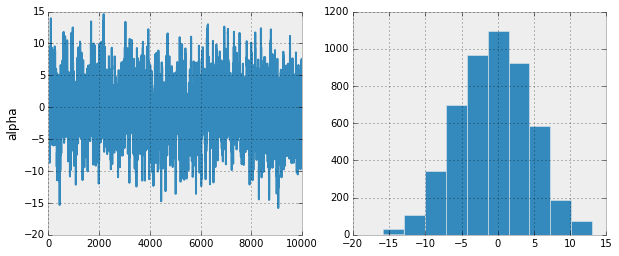

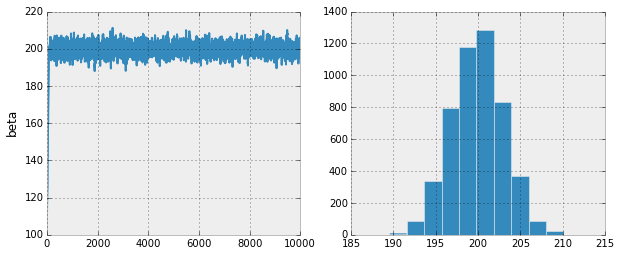

In [9]:
for label, samples in zip(['alpha', 'beta'], trace.T):
    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    axes[0].plot(samples)
    axes[0].set_ylabel(label)
    axes[1].hist(samples[n_iter/2:])
    
    plt.savefig("Posteior Metropolis.svg", transparent = True)

### Trace distribution

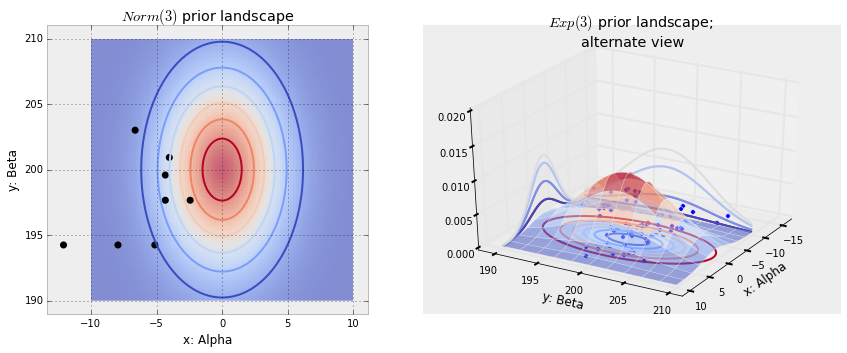

In [7]:
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

figsize(12.5, 5)
fig = plt.figure()
plt.subplot(121)
ax = fig.add_subplot(121)


x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y+200)

# We set our normal distribution
nor_x = stats.norm.pdf(x, scale=5) # Related to estandar deviation: more unknown in beta
nor_y = stats.norm.pdf(y, scale=3.162278 ) 


# Contour plot:
M = np.dot(nor_x[:, None], nor_y[None, :])
CS = plt.contour(X, Y, M,  cmap=cm.coolwarm)#,extent=(-30, 30, -30, 30))
im = plt.imshow(M, interpolation='none', origin='lower', alpha=0.6,
     cmap=cm.coolwarm, extent=(-10, 10, 190, 210))



for i in range(9074,9082):
    plt.scatter(trace[i,0],trace[i,1], c="k", s=50, edgecolor="none")

plt.xlabel("x: Alpha")
plt.ylabel("y: Beta")
#plt.xlim(-10,10)
#plt.ylim(-10,10)

plt.title("$Norm(3)$ prior landscape")
plt.tight_layout()


# 3D plot
ax = fig.add_subplot(122, projection='3d')
ax.plot_surface(X, Y, M,  cmap=cm.coolwarm, alpha=0.5)
ax.view_init(azim=390)

for i in range(9000,9080):
    ax.scatter(trace[i,0], trace[i,1])
plt.title("$Exp(3)$ prior landscape; \nalternate view")
#ax.set_xlim([-10, 10])
#ax.set_ylim([-10, 10])

ax.set_zlim([0, 0.02])
ax.set_xlabel("x: Alpha")
ax.set_ylabel("y: Beta")

cset = ax.contour(X, Y, M, zdir='z', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='x', offset=-10, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='y', offset= 190, cmap=cm.coolwarm_r)






### Searching algorithm


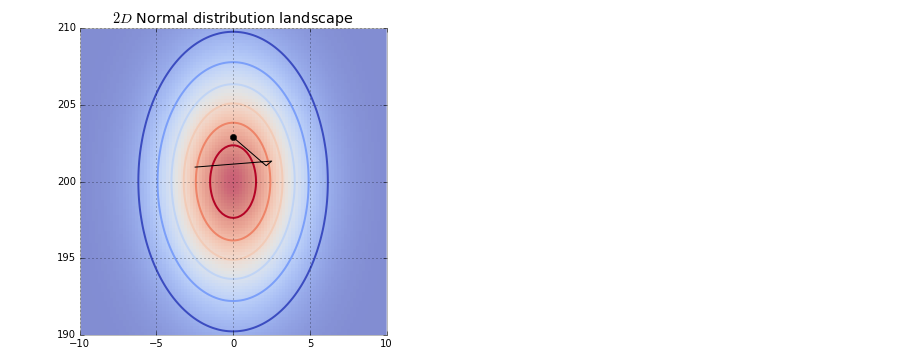
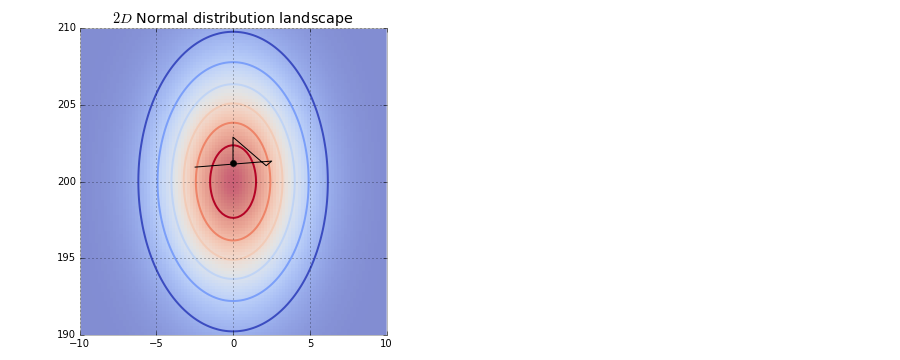
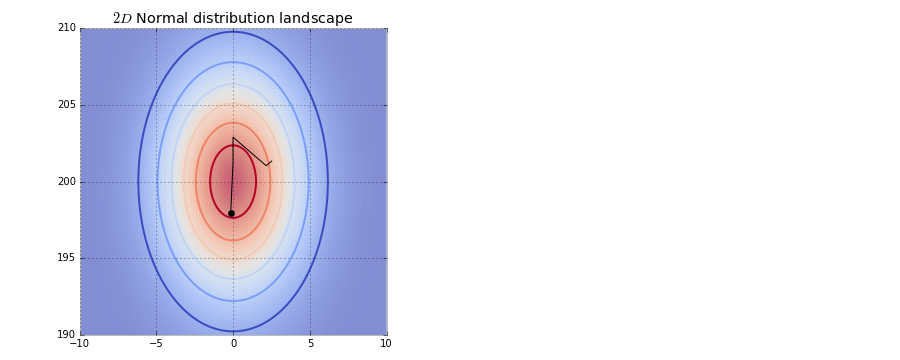
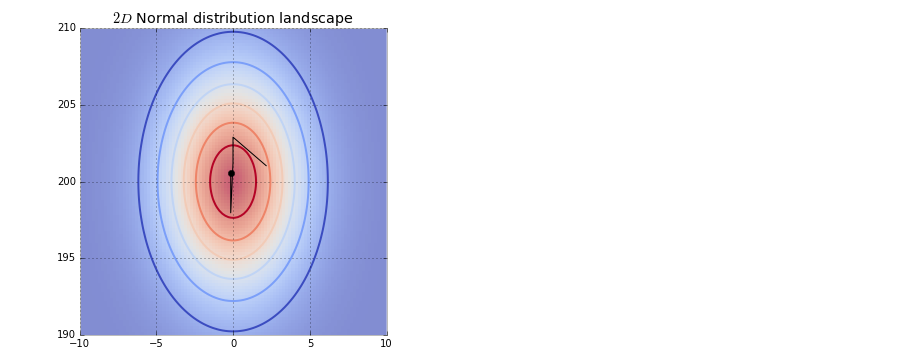
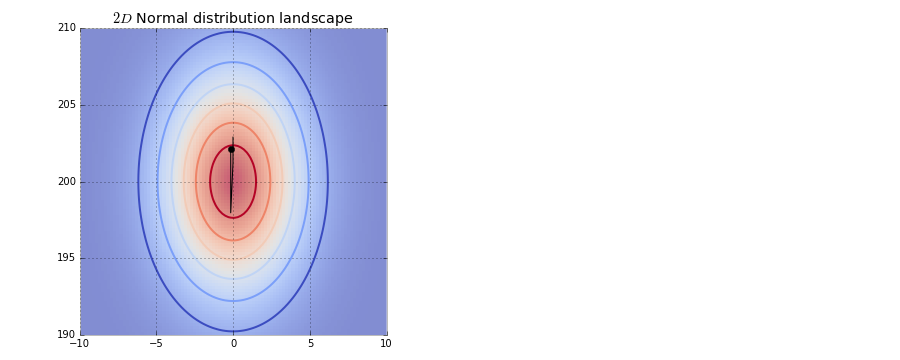
...
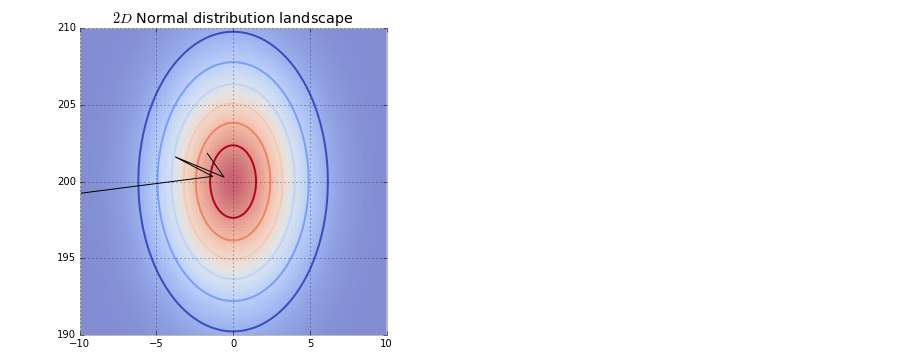
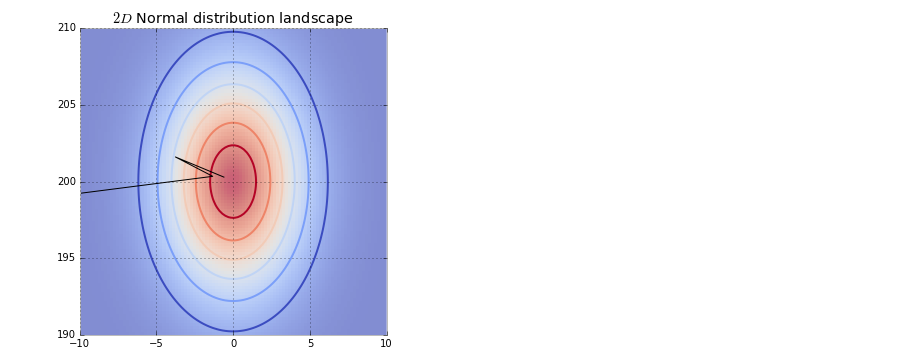
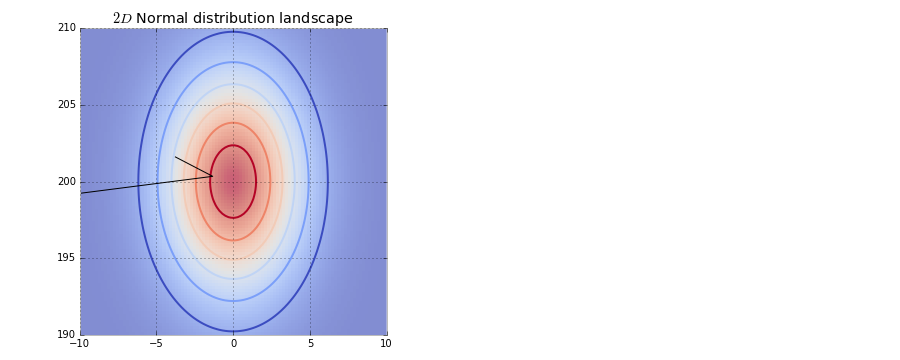
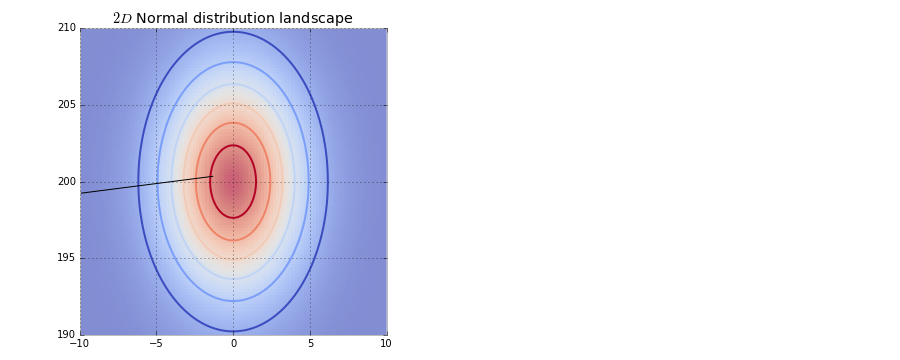
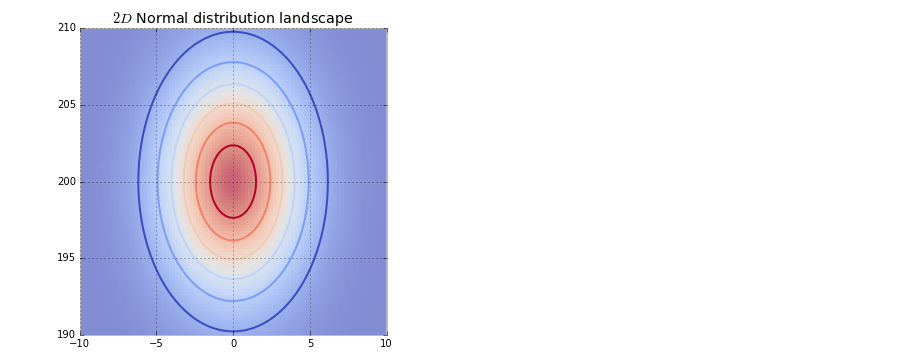

In [8]:
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from JSAnimation import IPython_display
from matplotlib import animation

figsize(12.5, 5)
fig = plt.figure()
ax = fig.add_subplot(121)


x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y+200)

# We set our normal distribution
nor_x = stats.norm.pdf(x, scale=5) # Related to estandar deviation: more unknown in beta
nor_y = stats.norm.pdf(y, scale=3.162278 ) 


# Contour plot:
M = np.dot(nor_x[:, None], nor_y[None, :])
CS = plt.contour(X, Y, M,  cmap=cm.coolwarm)#,extent=(-30, 30, -30, 30))
im = plt.imshow(M, interpolation='none', origin='lower', alpha=0.6,
     cmap=cm.coolwarm, extent=(-10, 10, 190, 210))
 


plt.title("$2D$ Normal distribution landscape")


plt.tight_layout()



points, = ax.plot([], [], 'bo', ms=6, color = "k")
line, = ax.plot([], [], lw=1, color = "k")

def init():

    points.set_data([], [])
    line.set_data([], [])

    return points

def animate(i):
    burn = i+4000
    points.set_data(trace[burn,0],trace[burn,1])
    x = np.array([trace[burn,0], trace[burn-1,0], trace[burn-2,0], trace[burn-3,0],trace[burn-4,0]])
    y = np.array([trace[burn,1], trace[burn-1,1], trace[burn-2,1], trace[burn-3,1],trace[burn-4,1]])
    
    line.set_data(x,y)

    return points, line


animation.FuncAnimation(fig, animate, init_func=init,
                        frames=100, interval=180, blit=True)


## Low variation rate.

i.e. Small steps 

In [12]:
trace_lovar, acc = metropolis(n_iter, prop_var = 0.1)

0.1
Iteration 0
Iteration 1000
Iteration 2000
Iteration 3000
Iteration 4000
Iteration 5000
Iteration 6000
Iteration 7000
Iteration 8000
Iteration 9000


### Acceptance rate

Since the standar deviation of our steps is very low, the acceptance rate will be very high:

In [13]:
np.array(acc, float)/n_iter

array([ 0.9873,  0.9135])

### Plotting posterior

Because the acceptance rate is very high, the posterior will not converge (except in the infinite).

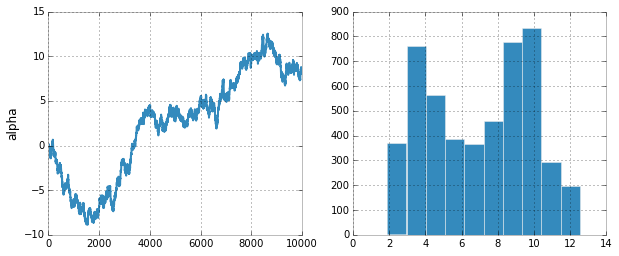

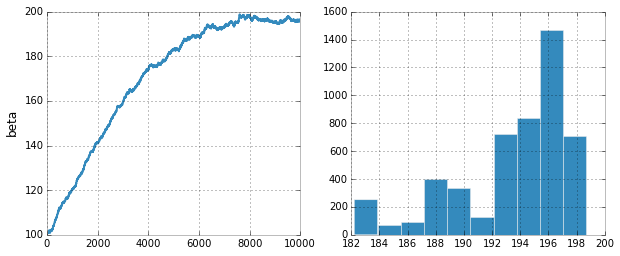

In [14]:
for label, samples in zip(['alpha', 'beta'], trace_lovar.T):
    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    axes[0].plot(samples)
    axes[0].set_ylabel(label)
    axes[1].hist(samples[n_iter/2:])

### Trace distibution

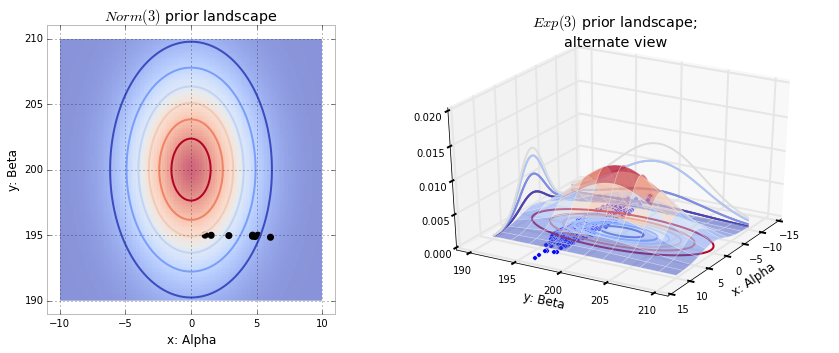

In [15]:
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

figsize(12.5, 5)
fig = plt.figure()
plt.subplot(121)
ax = fig.add_subplot(121)


x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y+200)

# We set our normal distribution
nor_x = stats.norm.pdf(x, scale=5) # Related to estandar deviation: more unknown in beta
nor_y = stats.norm.pdf(y, scale=3.162278 ) 


# Contour plot:
M = np.dot(nor_x[:, None], nor_y[None, :])
CS = plt.contour(X, Y, M,  cmap=cm.coolwarm)#,extent=(-30, 30, -30, 30))
im = plt.imshow(M, interpolation='none', origin='lower', alpha=0.6,
     cmap=cm.coolwarm, extent=(-10, 10, 190, 210))



for i in range(9074,9082):
    plt.scatter(trace[i,0],trace_lovar[i,1], c="k", s=50, edgecolor="none")

plt.xlabel("x: Alpha")
plt.ylabel("y: Beta")
#plt.xlim(-10,10)
#plt.ylim(-10,10)

plt.title("$Norm(3)$ prior landscape")
plt.tight_layout()


# 3D plot
ax = fig.add_subplot(122, projection='3d')
ax.plot_surface(X, Y, M,  cmap=cm.coolwarm, alpha=0.5)
ax.view_init(azim=390)

for i in range(8000,9080):
    ax.scatter(trace[i,0], trace_lovar[i,1])
plt.title("$Exp(3)$ prior landscape; \nalternate view")
#ax.set_xlim([-10, 10])
#ax.set_ylim([-10, 10])

ax.set_zlim([0, 0.02])
ax.set_xlabel("x: Alpha")
ax.set_ylabel("y: Beta")

cset = ax.contour(X, Y, M, zdir='z', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='x', offset=-10, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='y', offset= 190, cmap=cm.coolwarm_r)



This is cool because each dimension has their own size and therefore maybe a sted size is good for one dimension and bad for others. In addition depending on the initial values the choice of standard deviation of our steps can affect more or less the convergence


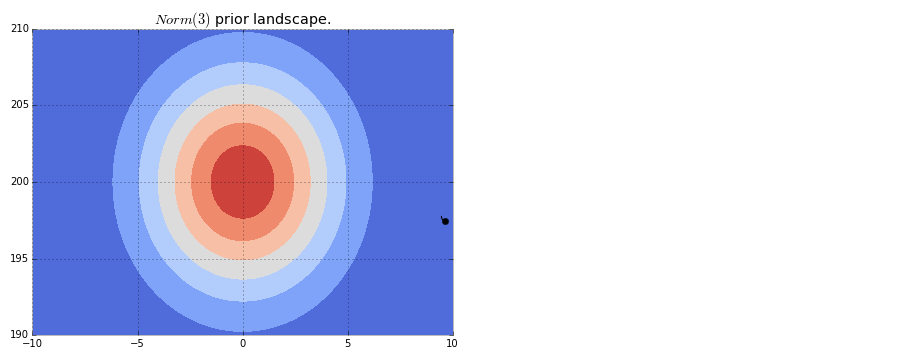
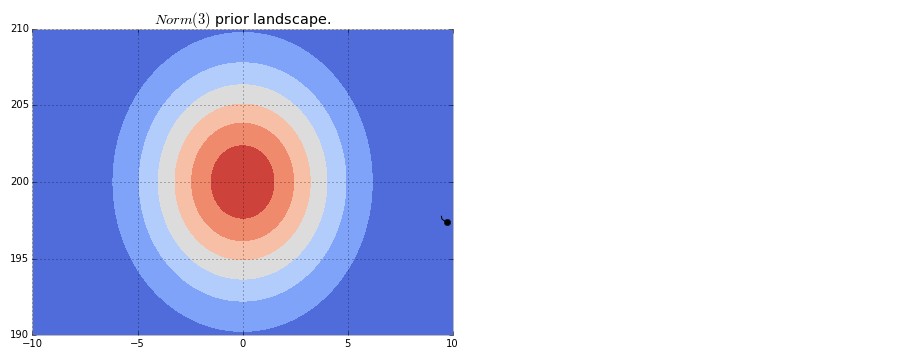
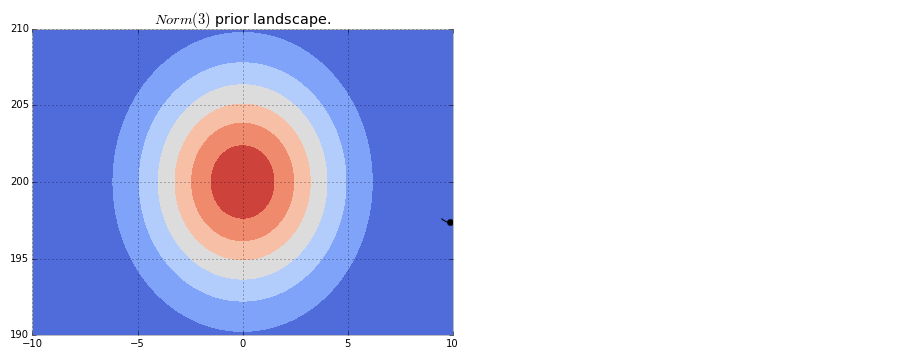
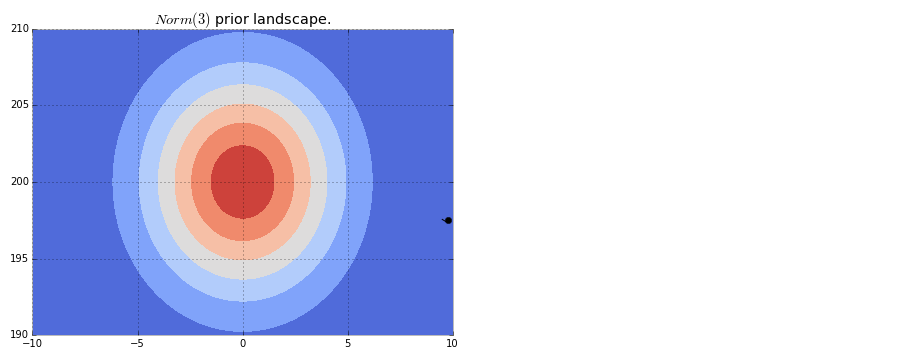
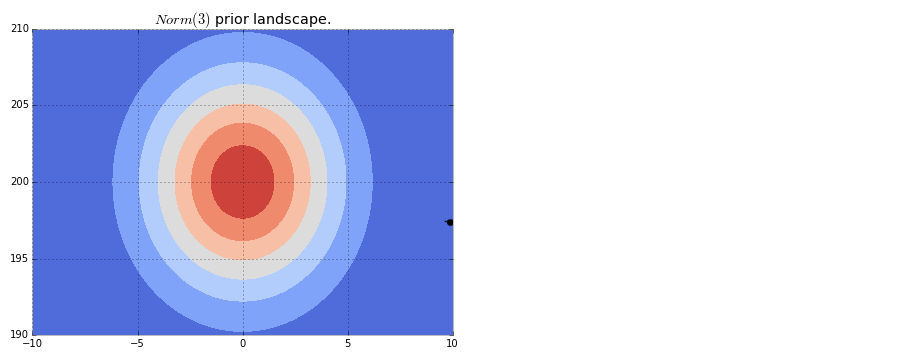
...
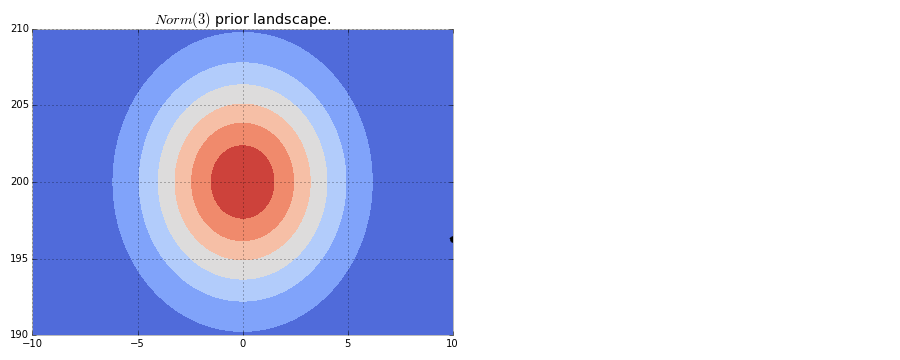
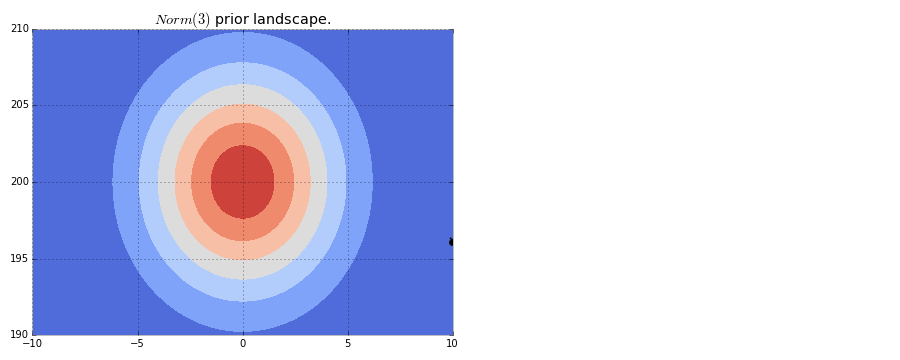
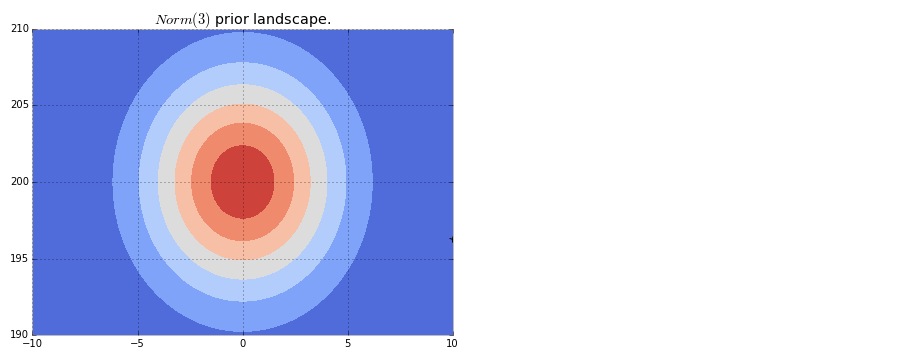
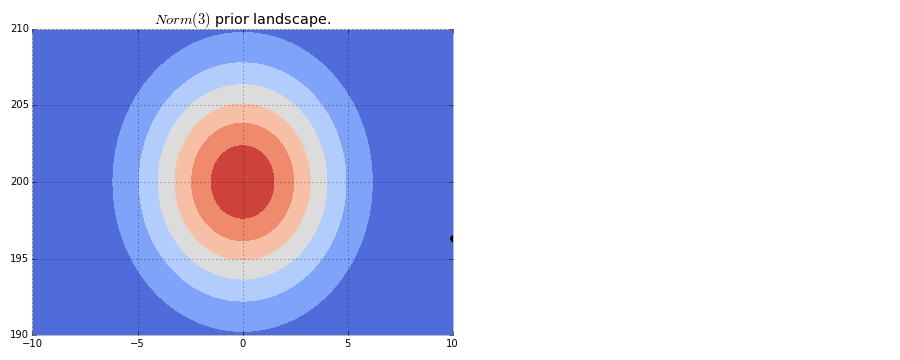
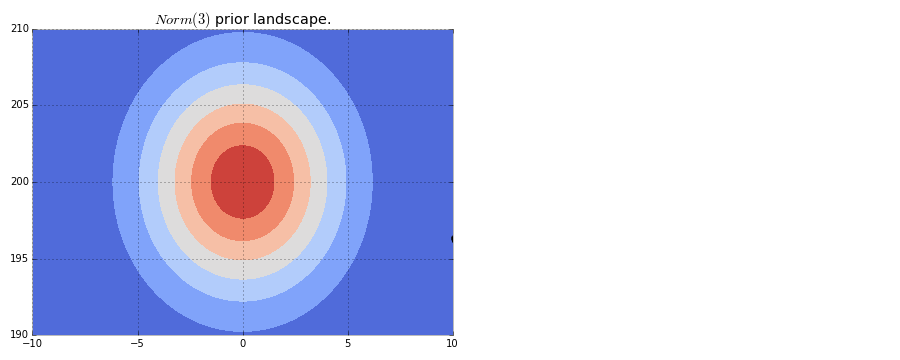

In [16]:
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from JSAnimation import IPython_display
from matplotlib import animation

figsize(12.5, 5)
fig = plt.figure()
ax = fig.add_subplot(121)


x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y+200)

# We set our normal distribution
nor_x = stats.norm.pdf(x, scale=5) # Related to estandar deviation: more unknown in beta
nor_y = stats.norm.pdf(y, scale=3.162278 ) 


# Contour plot:
M = np.dot(nor_x[:, None], nor_y[None, :])
CS = plt.contourf(X, Y, M,  cmap=cm.coolwarm)#, extent=(-15, 15, 90, 210))
#im = plt.imshow(M, interpolation='none', alpha=0.6,
 #    cmap=cm.coolwarm)#, extent=(-15, 15, 90, 210))
 


plt.title("$Norm(3)$ prior landscape.")


plt.tight_layout()



points, = ax.plot([], [], 'bo', ms=6, color = "k")
line, = ax.plot([], [], lw=1, color = "k")

def init():

    points.set_data([], [])
    line.set_data([], [])

    return points

def animate(i):
    burn = i+8000
    points.set_data(trace_lovar[burn,0],trace_lovar[burn,1])
    x = np.array([trace_lovar[burn,0], trace_lovar[burn-1,0], trace_lovar[burn-2,0], trace_lovar[burn-3,0],trace_lovar[burn-4,0]])
    y = np.array([trace_lovar[burn,1], trace_lovar[burn-1,1], trace_lovar[burn-2,1], trace_lovar[burn-3,1],trace_lovar[burn-4,1]])
    
    line.set_data(x,y)

    return points, line


animation.FuncAnimation(fig, animate, init_func=init,
                        frames=100, interval=180, blit=True)

## High variance

i.e. big steaps

In [17]:
trace_hivar, acc = metropolis(n_iter, prop_var = 400)

400
Iteration 0
Iteration 1000
Iteration 2000
Iteration 3000
Iteration 4000
Iteration 5000
Iteration 6000
Iteration 7000
Iteration 8000
Iteration 9000


### Acceptance rate
Acceptance rate very low what stucks the searching reducing the convergence

In [18]:
np.array(acc, float)/n_iter

array([ 0.0173,  0.0109])

## Plotting posterior

Because the acceptance rate is very low, the posterior will not converge (except in the infinite).

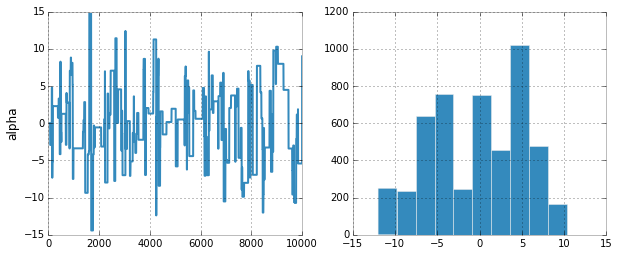

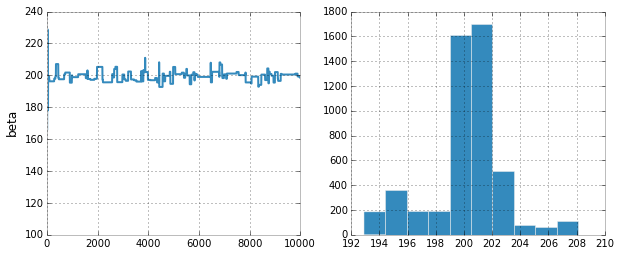

In [19]:
for param, samples in zip(['alpha', 'beta'], trace_hivar.T):
    fig, axes = plt.subplots(1, 2, figsize=(10,4))
    axes[0].plot(samples)
    axes[0].set_ylabel(param)
    axes[1].hist(samples[n_iter/2:])

### Trace distribution

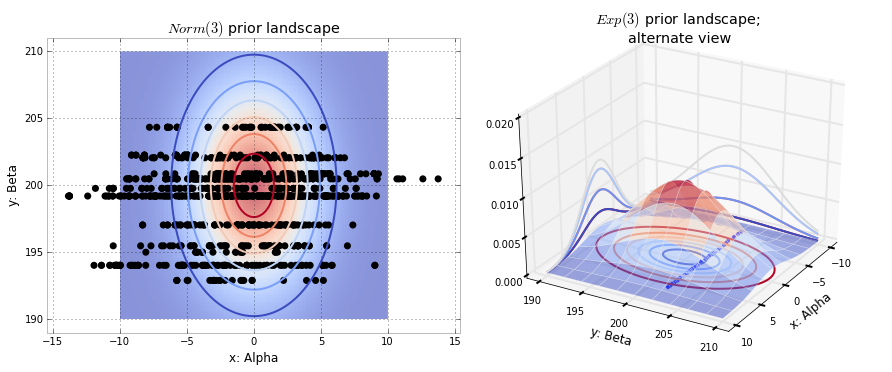

In [20]:
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

figsize(12.5, 5)
fig = plt.figure()
plt.subplot(121)
ax = fig.add_subplot(121)


x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y+200)

# We set our normal distribution
nor_x = stats.norm.pdf(x, scale=5) # Related to estandar deviation: more unknown in beta
nor_y = stats.norm.pdf(y, scale=3.162278 ) 


# Contour plot:
M = np.dot(nor_x[:, None], nor_y[None, :])
CS = plt.contour(X, Y, M,  cmap=cm.coolwarm)#,extent=(-30, 30, -30, 30))
im = plt.imshow(M, interpolation='none', origin='lower', alpha=0.6,
     cmap=cm.coolwarm, extent=(-10, 10, 190, 210))



for i in range(8074,9082):
    plt.scatter(trace[i,0],trace_hivar[i,1], c="k", s=50, edgecolor="none")

plt.xlabel("x: Alpha")
plt.ylabel("y: Beta")
#plt.xlim(-10,10)
#plt.ylim(-10,10)

plt.title("$Norm(3)$ prior landscape")
plt.tight_layout()


# 3D plot
ax = fig.add_subplot(122, projection='3d')
ax.plot_surface(X, Y, M,  cmap=cm.coolwarm, alpha=0.5)
ax.view_init(azim=390)

for i in range(9000,9080):
    ax.scatter(trace[i,0], trace_hivar[i,1])
plt.title("$Exp(3)$ prior landscape; \nalternate view")
#ax.set_xlim([-10, 10])
#ax.set_ylim([-10, 10])

ax.set_zlim([0, 0.02])
ax.set_xlabel("x: Alpha")
ax.set_ylabel("y: Beta")

cset = ax.contour(X, Y, M, zdir='z', offset=0, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='x', offset=-10, cmap=cm.coolwarm_r)
cset = ax.contour(X, Y, M, zdir='y', offset= 190, cmap=cm.coolwarm_r)


### Search algorithm


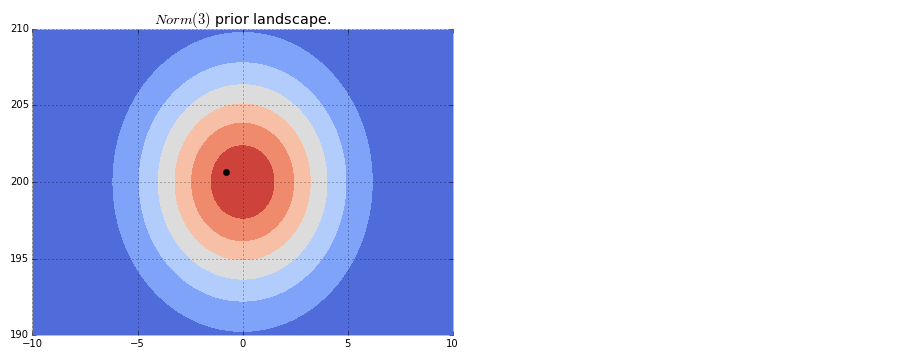
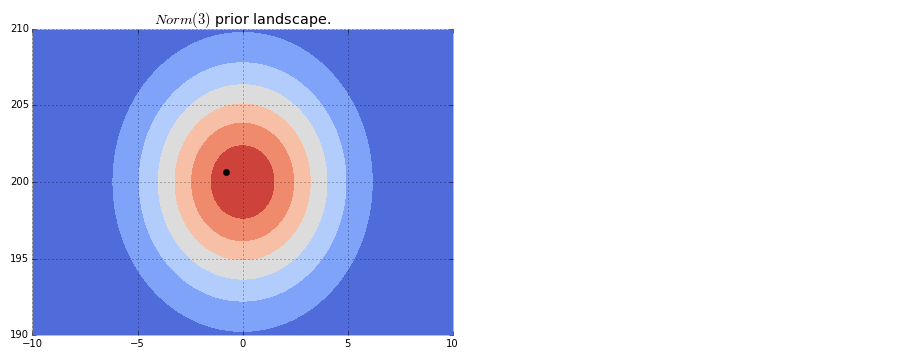
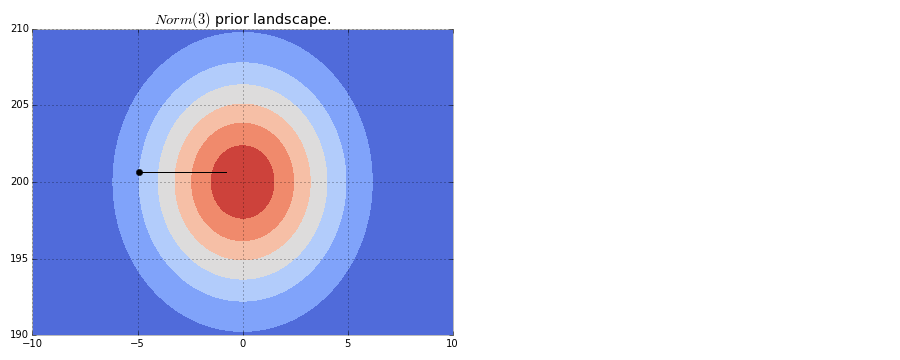
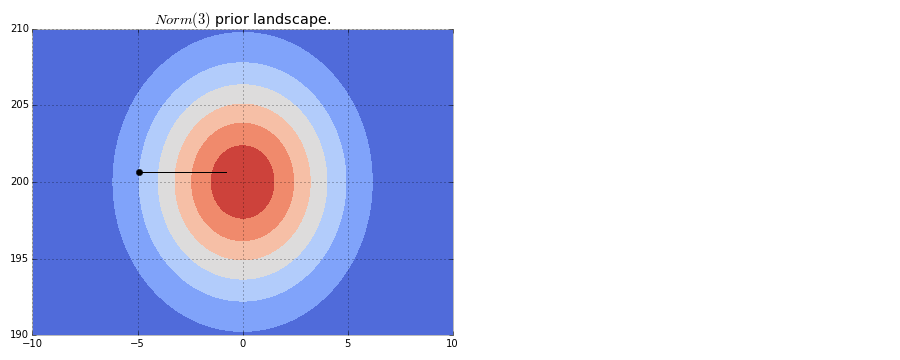
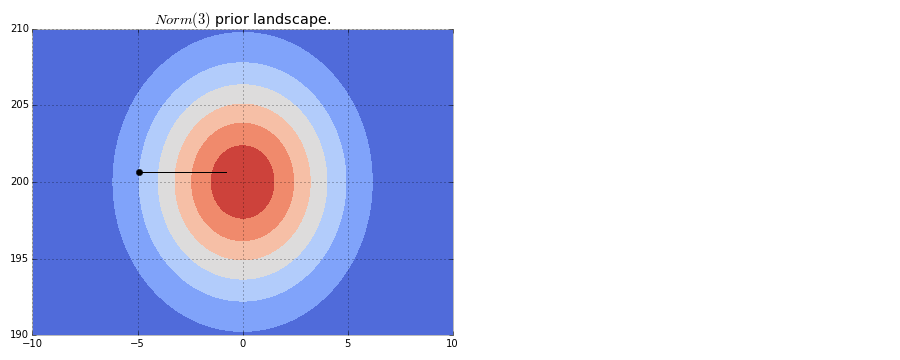
...
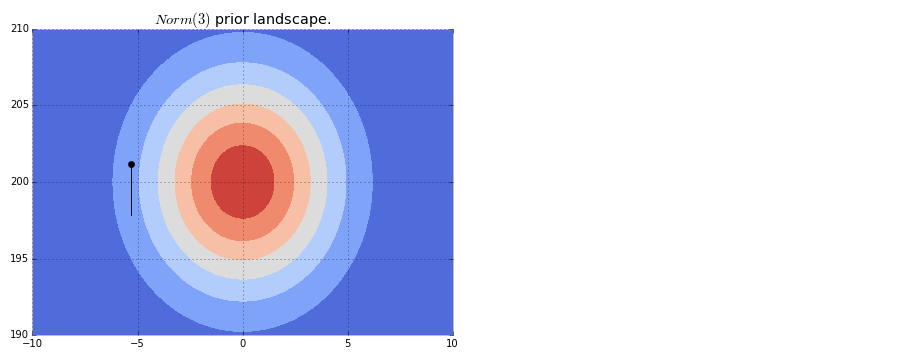
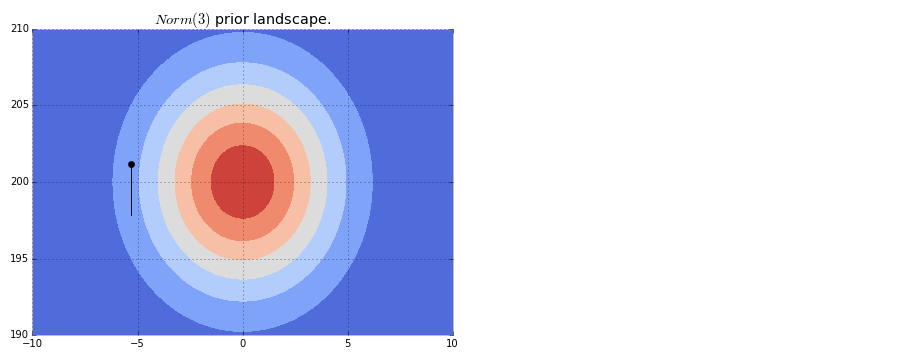
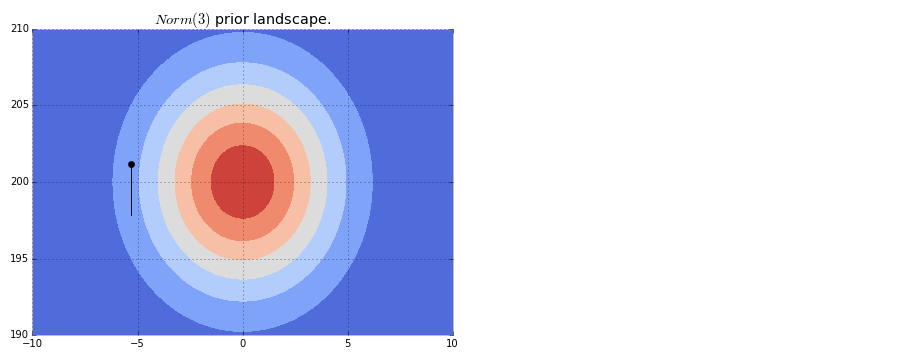
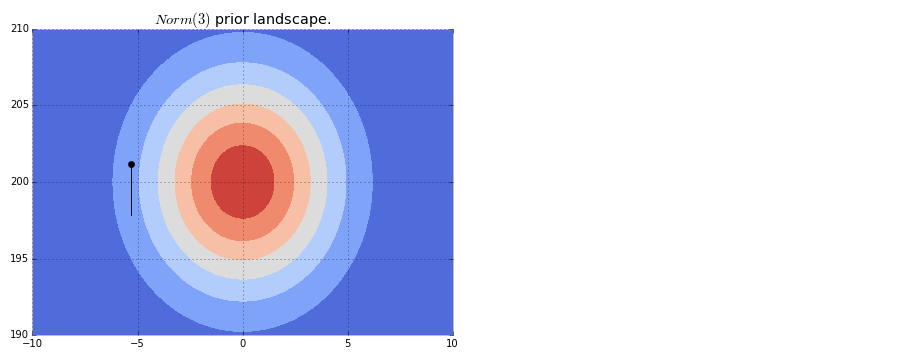
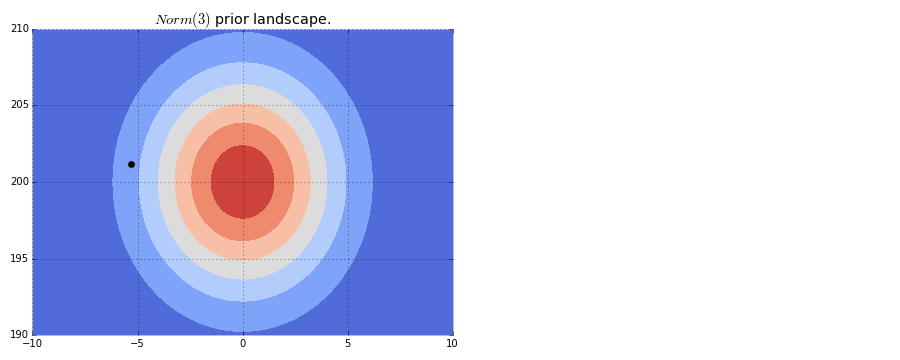

In [22]:
from matplotlib import cm
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from JSAnimation import IPython_display
from matplotlib import animation

figsize(12.5, 5)
fig = plt.figure()
ax = fig.add_subplot(121)


x = y = np.linspace(-10, 10, 100)

X, Y = np.meshgrid(x, y+200)

# We set our normal distribution
nor_x = stats.norm.pdf(x, scale=5) # Related to estandar deviation: more unknown in beta
nor_y = stats.norm.pdf(y, scale=3.162278 ) 


# Contour plot:
M = np.dot(nor_x[:, None], nor_y[None, :])
CS = plt.contourf(X, Y, M,  cmap=cm.coolwarm)#, extent=(-15, 15, 90, 210))
#im = plt.imshow(M, interpolation='none', alpha=0.6,
 #    cmap=cm.coolwarm)#, extent=(-15, 15, 90, 210))
 


plt.title("$Norm(3)$ prior landscape.")


plt.tight_layout()



points, = ax.plot([], [], 'bo', ms=6, color = "k")
line, = ax.plot([], [], lw=1, color = "k")

def init():

    points.set_data([], [])
    line.set_data([], [])

    return points

def animate(i):
    burn = i+7000
    points.set_data(trace_hivar[burn,0],trace_hivar[burn,1])
    x = np.array([trace_hivar[burn,0], trace_hivar[burn-1,0], trace_hivar[burn-2,0], trace_hivar[burn-3,0],trace_hivar[burn-4,0]])
    y = np.array([trace_hivar[burn,1], trace_hivar[burn-1,1], trace_hivar[burn-2,1], trace_hivar[burn-3,1],trace_hivar[burn-4,1]])
    
    line.set_data(x,y)

    return points, line


animation.FuncAnimation(fig, animate, init_func=init,
                        frames=100, interval=180, blit=True)

### Adaptive Metropolis

In order to avoid having to set the proposal variance by trial-and-error, we can add some tuning logic to the algorithm. The following implementation of Metropolis-Hastings reduces proposal variances  by 10% when the acceptance rate is low, and increases it by 10% when the acceptance rate is high.